<a href="https://colab.research.google.com/github/vinayprabhu/Colabarama/blob/master/Dall_E_low_D.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Install DALL-E and tensorly

In [1]:
!pip install --quiet git+https://github.com/openai/DALL-E.git
!pip install --quiet tensorly

The imports and a couple of off-the-shelf helper funcs

In [2]:
import io
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import os, sys
import requests
import PIL

import torch
import torchvision.transforms as T
import torchvision.transforms.functional as TF

from dall_e          import map_pixels, unmap_pixels, load_model
from IPython.display import display, display_markdown

target_image_size = 256

def download_image(url):
    resp = requests.get(url)
    resp.raise_for_status()
    return PIL.Image.open(io.BytesIO(resp.content))

def preprocess(img):
    s = min(img.size)
    
    if s < target_image_size:
        raise ValueError(f'min dim for image {s} < {target_image_size}')
        
    r = target_image_size / s
    s = (round(r * img.size[1]), round(r * img.size[0]))
    img = TF.resize(img, s, interpolation=PIL.Image.LANCZOS)
    img = TF.center_crop(img, output_size=2 * [target_image_size])
    img = torch.unsqueeze(T.ToTensor()(img), 0)
    return map_pixels(img)

/usr/local/lib/python3.7/dist-packages/requests/__init__.py:91: RequestsDependencyWarning: urllib3 (1.26.4) or chardet (3.0.4) doesn't match a supported version!
  RequestsDependencyWarning)


Make sure you have the GPU instance ...

In [3]:
!nvidia-smi

Sun Apr 11 18:11:14 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.67       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   38C    P0    27W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [4]:
# This can be changed to a GPU, e.g. 'cuda:0'.
dev = torch.device('cuda:0')
# dev = torch.device('cpu')
# For faster load times, download these files locally and use the local paths instead.
enc = load_model("https://cdn.openai.com/dall-e/encoder.pkl", dev)
dec = load_model("https://cdn.openai.com/dall-e/decoder.pkl", dev)
# enc = load_model("encoder.pkl", dev)
# dec = load_model("decoder.pkl", dev)

A simple example to get acquainted with the enc-dec pipeline and the tensor-shapes involved

/usr/local/lib/python3.7/dist-packages/torchvision/transforms/functional.py:365: UserWarning: Argument interpolation should be of type InterpolationMode instead of int. Please, use InterpolationMode enum.
  "Argument interpolation should be of type InterpolationMode instead of int. "


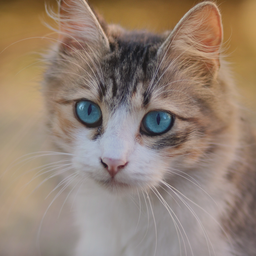

Shape of z_logits: torch.Size([1, 8192, 32, 32])
Shape of z_argmax: torch.Size([1, 32, 32])
Shape of z_onehot: torch.Size([1, 8192, 32, 32])
Shape of x_stats: torch.Size([1, 6, 256, 256])
Shape of x_rec: torch.Size([1, 3, 256, 256])


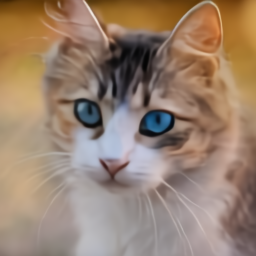

In [5]:
import torch.nn.functional as F
url_cat='https://upload.wikimedia.org/wikipedia/commons/c/c7/Tabby_cat_with_blue_eyes-3336579.jpg'
x_orig = preprocess(download_image(url_cat))
display_markdown('Original image:')
display(T.ToPILImage(mode='RGB')(x_orig[0]))
# ENCODER
z_logits = enc(x_orig.cuda())
print(f'Shape of z_logits: {z_logits.shape}')
z_argmax = torch.argmax(z_logits, axis=1)
print(f'Shape of z_argmax: {z_argmax.shape}')
z_onehot = F.one_hot(z_argmax, num_classes=enc.vocab_size).permute(0, 3, 1, 2).float()
print(f'Shape of z_onehot: {z_onehot.shape}')
# DEC
x_stats = dec(z_onehot).float()
print(f'Shape of x_stats: {x_stats.shape}')
x_rec = unmap_pixels(torch.sigmoid(x_stats[:, :3]))
print(f'Shape of x_rec: {x_rec.shape}')
x_rec = T.ToPILImage(mode='RGB')(x_rec[0])
display_markdown('Reconstructed image:')
display(x_rec)

# Compression the Encding tensor.

Here's a simple 101 intro the 2 _standard_ tensor decomposition techniques: CPD and Tucker.
Both are outer product decompositions, but they have very different structural properties. As a rule of thumb it is usually advised to use CPD for latent parameter estimation and Tucker for subspace estimation, compression, and
dimensionality reduction.


<img src="https://i.ibb.co/8mD4kF6/tensor-decomp.png" width=400 height=350 />


In [6]:
import tensorly as tl
tl.set_backend('pytorch')
from tensorly.decomposition import tucker
import numpy as np

Now, let us see how incredible compressible these tensors really are!

/usr/local/lib/python3.7/dist-packages/tensorly/backend/pytorch_backend.py:36: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  requires_grad=requires_grad)


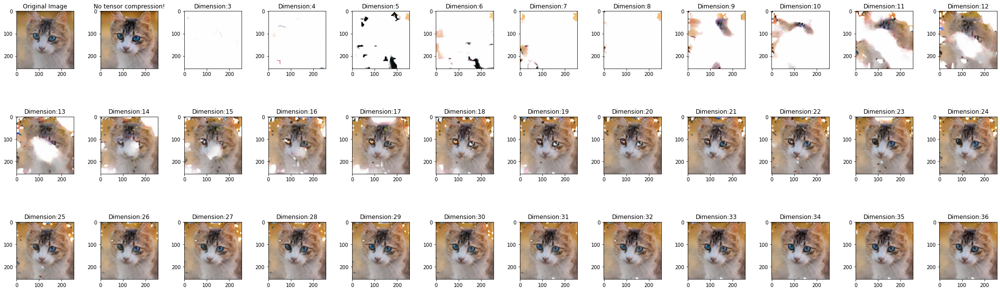

In [7]:
# Declare a vector of low-Ds
DIM_VEC=np.arange(3,37)
# Init tensor of images
image_array=np.zeros((len(DIM_VEC),256,256,3))
import os
if not os.path.exists('./compr/'):
    os.makedirs('./compr/')

plt.figure(figsize=(28,9))
plt.subplot(3,12,1)
x_orig= T.ToPILImage(mode='RGB')(x_orig[0])
plt.imshow(np.asarray(x_orig))
plt.title('Original Image')

plt.subplot(3,12,2)
plt.imshow(np.asarray(x_rec))
plt.title('No tensor compression!')
img_list=[]
for ind_d,DIM_LOW in enumerate(DIM_VEC):
    tensor = tl.tensor(z_logits[0], dtype=tl.float64)
    tensor_tucker = tucker(tensor, rank=[DIM_LOW,32, 32])
    recon=tl.tucker_to_tensor(tensor_tucker)
    z_logits_recon=recon.unsqueeze_(0).to(torch.float32)
#     print('Reconstructed!')
    z_argmax = torch.argmax(z_logits_recon, axis=1)
    z_onehot = F.one_hot(z_argmax, num_classes=enc.vocab_size).permute(0, 3, 1, 2).float()
    x_stats = dec(z_onehot.cuda()).float()
    x_rec = unmap_pixels(torch.sigmoid(x_stats[:, :3]))
    x_rec = T.ToPILImage(mode='RGB')(x_rec[0])
    image_array[ind_d]=np.asarray(x_rec)
    plt.subplot(3,12,ind_d+3)
    plt.imshow(np.asarray(x_rec))
    plt.title(f'Dimension:{DIM_LOW}')
    plt.savefig(f'./compr/_{ind_d}.png')
    img_list.append(f'./compr/_{ind_d}.png')
plt.tight_layout()
plt.savefig('cat_tucker_collage.png',dpi=300)

In [8]:
import imageio
images = [imageio.imread(file) for file in img_list]
imageio.mimwrite('cat_lowD.gif', images, fps=1)

In [9]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
from IPython import display

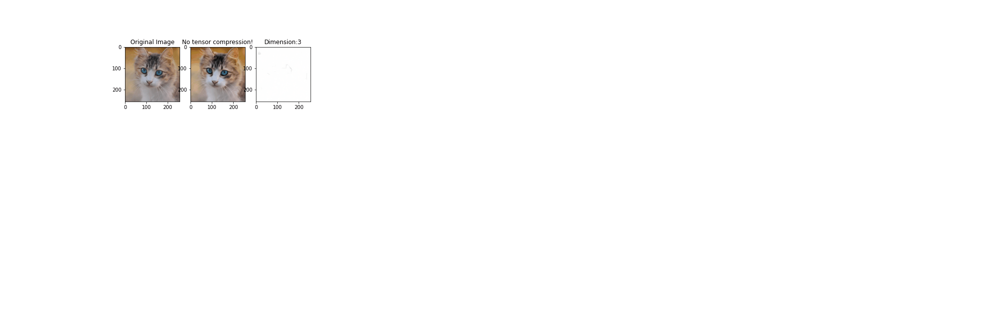

In [10]:
# It is important to run the above cell 
# before running the cell below.
# See: https://github.com/ipython/ipython/issues/10045

from pathlib import Path
gifPath = Path("cat_lowD.gif")
# Display GIF in Jupyter, CoLab, IPython
with open(gifPath,'rb') as f:
    display.Image(data=f.read(), format='png')

OK. So, let us strike a deal. Seems like ~ 36 D might well fit the bill without too much loss.
Now, let's fix this low-D and visualize some examples:

Reconstructed!
Core shape: torch.Size([36, 32, 32])
Factor 0 shape: torch.Size([8192, 36])
Factor 1 shape: torch.Size([32, 32])
Factor 2 shape: torch.Size([32, 32])
333824 0.039794921875


Text(0.5, 1.0, 'Reconstruction with 96.021% compression')

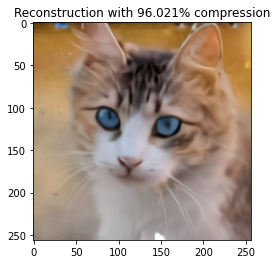

In [11]:
DIM_LOW=36
tensor_tucker = tucker(tensor, rank=[DIM_LOW,32, 32])
recon=tl.tucker_to_tensor(tensor_tucker)
z_logits_recon=recon.unsqueeze_(0).to(torch.float32)
print('Reconstructed!')
z_argmax = torch.argmax(z_logits_recon, axis=1)
z_onehot = F.one_hot(z_argmax, num_classes=enc.vocab_size).permute(0, 3, 1, 2).float()
x_stats = dec(z_onehot.cuda()).float()
x_rec = unmap_pixels(torch.sigmoid(x_stats[:, :3]))
x_rec = T.ToPILImage(mode='RGB')(x_rec[0])
image_array[ind_d]=np.asarray(x_rec)

##########################################
print(f'Core shape: {tensor_tucker.core.shape}')
compr_dim=np.prod(tensor_tucker.core.shape)
for i in range(len(tensor_tucker.factors)):
    print(f'Factor {i} shape: {tensor_tucker.factors[i].shape}')
    compr_dim+=np.prod(tensor_tucker.factors[i].shape)
compr_factor=compr_dim/(8192*32*32)
print(compr_dim, compr_factor)

plt.imshow(np.asarray(x_rec))
plt.title(f'Reconstruction with {100-np.round(compr_factor*100,3)}% compression')

Examplar gallery:

/usr/local/lib/python3.7/dist-packages/torchvision/transforms/functional.py:365: UserWarning: Argument interpolation should be of type InterpolationMode instead of int. Please, use InterpolationMode enum.
  "Argument interpolation should be of type InterpolationMode instead of int. "
/usr/local/lib/python3.7/dist-packages/tensorly/backend/pytorch_backend.py:36: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  requires_grad=requires_grad)


Reconstructed!


<Figure size 576x216 with 0 Axes>

Text(0.5, 1.0, 'Original')

Text(0.5, 1.0, 'Dimension:36')

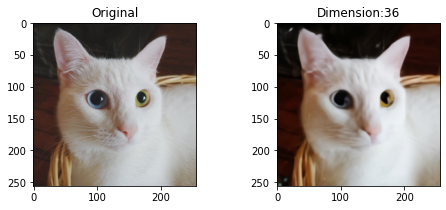

In [12]:
url_cat_2='https://upload.wikimedia.org/wikipedia/commons/b/b1/VAN_CAT.png'
x = preprocess(download_image(url_cat_2))
z_2_logits = enc(x.cuda())
tensor = tl.tensor(z_2_logits[0], dtype=tl.float64)
tensor_tucker = tucker(tensor, rank=[DIM_LOW,32, 32])
recon=tl.tucker_to_tensor(tensor_tucker)
z_logits_recon=recon.unsqueeze_(0).to(torch.float32)
print('Reconstructed!')
z_argmax = torch.argmax(z_logits_recon, axis=1)
z_onehot = F.one_hot(z_argmax, num_classes=enc.vocab_size).permute(0, 3, 1, 2).float()
x_stats = dec(z_onehot.cuda()).float()
x_rec = unmap_pixels(torch.sigmoid(x_stats[:, :3]))
x_rec = T.ToPILImage(mode='RGB')(x_rec[0])
image_array[ind_d]=np.asarray(x_rec)
plt.figure(figsize=(8,3))
plt.subplot(121)
plt.imshow(T.ToPILImage(mode='RGB')(x[0]))
plt.title('Original')
plt.subplot(122)
plt.imshow(np.asarray(x_rec))
plt.title(f'Dimension:{DIM_LOW}')

/usr/local/lib/python3.7/dist-packages/torchvision/transforms/functional.py:365: UserWarning: Argument interpolation should be of type InterpolationMode instead of int. Please, use InterpolationMode enum.
  "Argument interpolation should be of type InterpolationMode instead of int. "
/usr/local/lib/python3.7/dist-packages/tensorly/backend/pytorch_backend.py:36: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  requires_grad=requires_grad)


Reconstructed!


<Figure size 576x216 with 0 Axes>

Text(0.5, 1.0, 'Original')

Text(0.5, 1.0, 'Dimension:36')

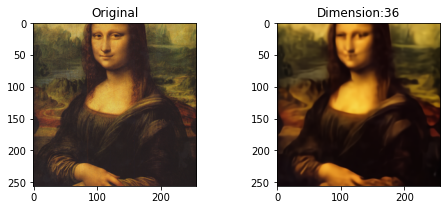

In [13]:
url_ml='https://upload.wikimedia.org/wikipedia/commons/6/6a/Mona_Lisa.jpg'
x = preprocess(download_image(url_ml))
z_2_logits = enc(x.cuda())
tensor = tl.tensor(z_2_logits[0], dtype=tl.float64)
tensor_tucker = tucker(tensor, rank=[DIM_LOW,32, 32])
recon=tl.tucker_to_tensor(tensor_tucker)
z_logits_recon=recon.unsqueeze_(0).to(torch.float32)
print('Reconstructed!')
z_argmax = torch.argmax(z_logits_recon, axis=1)
z_onehot = F.one_hot(z_argmax, num_classes=enc.vocab_size).permute(0, 3, 1, 2).float()
x_stats = dec(z_onehot.cuda()).float()
x_rec = unmap_pixels(torch.sigmoid(x_stats[:, :3]))
x_rec = T.ToPILImage(mode='RGB')(x_rec[0])
image_array[ind_d]=np.asarray(x_rec)
plt.figure(figsize=(8,3))
plt.subplot(121)
plt.imshow(T.ToPILImage(mode='RGB')(x[0]))
plt.title('Original')
plt.subplot(122)
plt.imshow(np.asarray(x_rec))
plt.title(f'Dimension:{DIM_LOW}')